In [7]:
import matplotlib.pyplot as plt
# from matplotlib.pyplot import *
import numpy as np
import pandas as pd
pd.set_option("display.max_rows", 10)
import seaborn as sns
import requests
import json
from pprint import pprint
# from igraph import *
import igraph
import networkx as nx
from math import floor

# to correctly display farsi chars
# to be used in farsify func
import arabic_reshaper
from bidi.algorithm import get_display

# task 1 (Get the title and tags of all theses related to a specific professor from IranDoc)

## Define custom functions

In [5]:
def farsify(text: str) -> str:
    '''
    Gets a string (in persian) and returns a persian string than can be shown correctly
    '''
    return get_display(arabic_reshaper.reshape(u'%s' % str(text)))

def duplicate_remover(a_list):
    list_ = []
    for item in a_list:
        if item not in list_:
            list_.append(item)
    return list_

def rgba_to_hex(rgb: tuple, normalized=False):
    '''
    returns HEX color for an RGB (or RGBA) color
        * in RGBA we igonre the alpha (A) value

    normalized: bool, default=False 
        whether the colors are normalized ([0, 1]) or not
    '''
    if normalized:
        coeffi = 255
    else:
        coeffi = 1
    return f'#{floor(rgb[0]*coeffi):02x}{floor(rgb[1]*coeffi):02x}{floor(rgb[2]*coeffi):02x}'

def tag_breaker(a_string):
    '''
    Input: get a string of comma-seperated item
    Return: the items as seperate strings
    '''
    word_gen = (word.strip() for word in a_string.split(","))
    yield word_gen

# didn't use it as it was too simple
def char_replacer(a_list, a_set_of_char, replacement):
    new_list = a_list
    
    for i in range(len(new_list)):
        new_list[i] = new_list[i].replace(a_set_of_char, replacement)
        
    return new_list

def replace_word_by_pattern(a_list):
    '''
    replace english keywords with their corresponding persion word
    '''
    new_list = a_list

    for i in range(len(new_list)):
        if new_list[i].lower() in list(patterns):
            new_list[i] = patterns[new_list[i].lower()]
    return new_list

patterns = {
    'integration': 'تلفیق',
    'supply chain management': 'مدیریت زنجیره تغذیه',
    'performance evaluation': 'ارزیابی عملکرد',
    'model': 'مدل',
    'trade': 'تجارت',
    'quality management': 'مدیریت کیفیت',
    'market competition': 'رقابت بازار',
    'iso standard': 'استاندارد ایزو',
    'knowledge management': 'مدیریت دانش',
    'information technology': 'فناوری اطلاعات',
    'intelligent network': 'شبکه هوشمند',
    'waterway transportation': 'ترابری آبی',
    'container': 'بارگنج',
    'tracking': 'ردیابی',
    'global positioning system': 'سیستم مکان یابی جهانی',
    'radio direction finding system': 'سیستم جهت یابی رادیویی',
    'stock control': 'کنترل محموله',
    'purchasing': 'خرید',
    'competition': 'رقابت',
    'businesses': 'کسب و کارها',
    'کسب و کار': 'کسب و کارها',
    'organizational change': 'دگرگونی سازمانی',
    'transformation': 'تغییر شکل',
    'مدیریت کیفیت اروپایی (efqm)': 'مدیریت کیفیت اروپایی',
    'efqm': 'مدیریت کیفیت اروپایی',
    '(efqm)': 'مدیریت کیفیت اروپایی',
    'insurance': 'بیمه',
    'industrial management': 'مدیریت صنعتی',
    'customer relationship management': 'مدیریت ارتباط با مشتری',
    'crm': 'مدیریت ارتباط با مشتری',
    'technological innovations': 'نوآوری فنّاورانه',
    'medical education': 'آموزش پزشکی',
    'computer application': 'کاربرد رایانه',
    'learning': 'یادگیری',
    'electronic technology': 'فنّاوری الکترونیکی',
    'technology management': 'مدیریت فناوری',
    'dairy industry': 'صنعت لبنیات',
    'brand names': 'نام تجارتی',
    'pricing': 'قیمت گذاری',
    'value added': 'ارزش افزوده',
    'process': 'فرآیند',
    'diffusion': 'پخش',
    'distribution': 'توزیع',
    'company': 'شرکت',
    'commodities': 'کالا',
    'consumers': 'مصرف کننده',
    'organizational culture': 'فرهنگ سازمانی',
    'development strategy': 'راهبرد توسعه',
    'performance evaluation': 'ارزیابی عملکرد',
    'validity': 'اعتبار',
    'اعتبار(روایی)': 'اعتبار',
    'data analysis': 'تجزیه و تحلیل داده ها',
    'quality management': 'مدیریت کیفیت',
    'mathematical model': 'مدل ریاضی',
    'مدل ریاضی ی': 'مدل ریاضی',
    'total quality management': 'مدیریت کیفیت جامع',
    'client satisfaction': 'رضایت مشتری',
    'participation': 'مشارکت',
    'management styles': 'شیوه مدیریت',
    'management information system': 'سیستم مدیریت اطلاعات',
    'سیستم اطلاعات مدیریت': 'سیستم مدیریت اطلاعات',
    'enterprise resource planning': 'برنامه ریزی منبع سرمایه گذاری',
    'marketing techniques': 'فنون بازاریابی',
    'decision making': 'تصمیم گیری',
    'allocation': 'تخصیص',
    'human resources': 'منابع انسانی',
    'organizational change': 'فرایند تولید',
    'change agents': 'عوامل تغییر',
    'individual selection': 'انتخاب فردی',
    'strategic planning': 'برنامه ریزی راهبردی',
    'resistance': 'مقاومت',
    'management of change': 'مدیریت تغییر',
    'outsourcing': 'برون سپاری',
    'منبع یابی خارج از سازمان': '',
    'qualitative analysis': 'تجزیه کیفی',
    'productivity': 'بهره وری',
    'بهره': 'بهره وری',
    'effectiveness': 'اثر بخشی',
    'manufacturing process': 'فرایند تولید',
    'automobile industry': 'صنعت خودرو',
    'efficiency': 'کارآیی',
    'strategic materials': 'مصالح راهبردی',
    'decision making': 'تصمیم گیری',
    'iran': 'ایران',
    'information sources': 'منابع اطلاعاتی',
    'system analysis': 'تجزیه و تحلیل سیستم ها',
    'artificial intelligence': 'هوش مصنوعی',
    'object-oriented method': 'روش شیء گرا',
    'regression analysis': 'تحلیل رگرسیون',
    'expert system': 'سیستم خبره',
    'uncertainty': 'عدم قطعیت',
    'graph theory': 'نظریه گراف',
    'computer programming': 'برنامه نویسی',
    'برنامه نویسی رایانه ای': '',
    'fuzzy logic': 'منطق فازی',
    'سیاستهای shipment': 'سیاست های ارسال',
    'planning': 'برنامه ریزی'
}

## Generating URLs

In [6]:
scholar_first_name = 'محمد'
scholar_last_name = 'اقدسی'
response = requests.get(f'https://ganj.irandoc.ac.ir/api/v1/search/main?basicscope=5&fulltext_status=1&keywords={scholar_first_name}+{scholar_last_name}&results_per_page=4&sort_by=2&year_from=0&year_to=1400')
page_num = json.loads(response.text)['total_pages']

# creat a list of urls based on scholar's name and page number
urls = []
for i in range(1, page_num+1):
    base_url = f'https://ganj.irandoc.ac.ir/api/v1/search/main?basicscope=5&fulltext_status=1&keywords={scholar_first_name}+{scholar_last_name}&page={i}&results_per_page=4&sort_by=2&year_from=0&year_to=1400'
    urls.append(base_url)

print(*urls, sep=f"\n{79*'-'}\n")

https://ganj.irandoc.ac.ir/api/v1/search/main?basicscope=5&fulltext_status=1&keywords=محمد+اقدسی&page=1&results_per_page=4&sort_by=2&year_from=0&year_to=1400
-------------------------------------------------------------------------------
https://ganj.irandoc.ac.ir/api/v1/search/main?basicscope=5&fulltext_status=1&keywords=محمد+اقدسی&page=2&results_per_page=4&sort_by=2&year_from=0&year_to=1400
-------------------------------------------------------------------------------
https://ganj.irandoc.ac.ir/api/v1/search/main?basicscope=5&fulltext_status=1&keywords=محمد+اقدسی&page=3&results_per_page=4&sort_by=2&year_from=0&year_to=1400


### Extracting Thesis Titles and Tags

In [7]:
# request and return the result of all url(s) and deseralize them as well
all_page_results = [json.loads(requests.get(i).text) for i in urls]

counter_thesis = 1
theses = {}

for page in all_page_results:
    for thesis in page['results']:
#         print(f"{counter_thesis}. عنوان پایان نامه: \n\n", thesis['title'])
#         print("\n----------------tags---------------\n")
        
        # get all the tags for each thesis
        thesis_tag_url = 'https://ganj.irandoc.ac.ir/api/v1/articles/'+thesis['uuid']+'/show_tags'
        response = requests.get(thesis_tag_url)
        all_thesis_tags = json.loads(response.text)
        
        # creat a list of all tags for each thesis
        thesis_tags_farsi = [tag['title_fa'] for tag in all_thesis_tags['tags']]
#         thesis_tags_en = [tag['title_en'] for tag in all_thesis_tags['tags']]

#         print(*thesis_tags_farsi, sep="\n")
#         print(79*"=")
        
        theses[counter_thesis] = {"uuid": thesis['uuid'], "title": thesis['title'], "tags": thesis_tags_farsi}
        
        counter_thesis += 1

## check the result of extracting the title and tags of all theses

In [8]:
# pprint(theses)

# for num in range(1, len(theses)+1):
#     print(f"{counter_thesis}. عنوان پایان نامه: \n\n", theses[num]['title'])
    
#     print("\n----------------tags---------------\n")
#     print(*theses[num]['tags'], sep="\n")
#     print(79*"=")

print(theses[1])

{'uuid': 'e1160ca77a8b019975fec7d1f7d2241c', 'title': 'ارزیابی هماهنگی در اجرای پروژه های ساختمانی و عملکرد BIM در این رابطه', 'tags': ['هماهنگی', 'مدیریت منابع', 'مدل سازی اطلاعات ساختمان', 'یکپارچه سازی اطلاعات']}


## Replace half-space to full-space in tags + replace English word with farsi

In [9]:
# replace half-space to full-space in tags
# thesis is the key (int) in theses dict
for thesis in theses:
    for i in range(len(theses[thesis]['tags'])):
        # this changes the original tags (to be universal)
        theses[thesis]['tags'][i] = theses[thesis]['tags'][i].replace('\u200c', ' ')

# replace english words with farsi
# thesis is the key (int) in theses dict
for thesis in theses:
    # this changes the original tags (to be universal)
    theses[thesis]['tags'] = replace_word_by_pattern(theses[thesis]['tags'])
        
# # to test tags
# print([tag for thesis in theses for tag in theses[thesis]['tags']])

## Plot tags frequency

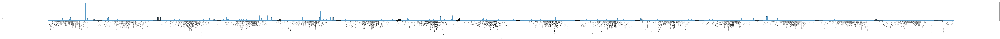

In [10]:
# merge all the tags to plot their frequency
tags_farsify = [farsify(tag) for thesis in theses for tag in theses[thesis]['tags']]
# titles_farsify = [farsify(theses[thesis]['title']) for thesis in theses]

fig, ax = plt.subplots(figsize=(250, 5))

# plt.hist(tag_list_final, ax=ax)
plt.ylabel(farsify("فراوانی کلید واژه ها"))
plt.xlabel(farsify("کلید واژه ها"))
plt.title(farsify("حوزه های کاری دکتر محمد اقدسی"))
ax.tick_params(axis='x', rotation=90)

ax = sns.histplot(data=tags_farsify, palette="Set3", ax=ax)

plt.show()

# task 2 (import theses and their tags as nodes in Gephi)

## Create an affiliation matrix

### Using Pandas
#### with theses titles as rows and all the tags as columns

In [11]:
# # use farsify just for plotting since the original tags, in theses dict, are not farsify
# # and they cannot be compared together later on
# titles = [theses[thesis]['title'] for thesis in theses]
titles = [theses[thesis]['uuid'] for thesis in theses]
tags = [tag for thesis in theses for tag in theses[thesis]['tags']]

# # for full name titles as rows
dataset_rows = titles
# for numbers instead of title names
# dataset_rows = theses.keys()

# we use duplicate_remover to remove any duplicate
# and have a clean list of all tags in theses
dataset_cols = duplicate_remover(tags)
# print(len(tags), "-", len(dataset_cols))


df = pd.DataFrame(columns=dataset_cols, index=dataset_rows)

df

,هماهنگی,مدیریت منابع,مدل سازی اطلاعات ساختمان,یکپارچه سازی اطلاعات,فرآیند کسب و کار,مشکلات تحلیل فرآیند,تامین کنندگان,فرآیندهای داخلی,ارتباطات با مشتریان,فرآیندکاوی آموزشی,...,توسعه صنعتی,روش های تولید,طرح های توسعه,بسپار سیلیکونی,تکنولوژی گروهی,سیستم های تولیدی,شبیه سازی کامپیوتری,مدلسازی فرایند,فرایند خدمات ارتوپدی,سلامت
e1160ca77a8b019975fec7d1f7d2241c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
81feaa652b70b35939ff2cf02f657688,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19c814a21b17c453117a9fdc3573659c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
dfc425108fadee394bd2b306a0072101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
a1ca6b7fe64cb6596fee46e65d1283b3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4a8907cdd04f39692ee721292d4a1d71,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
57bfe8f1fcca8a13dabf260cad0886bd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cdfb9e126b468cc6bf2b68c8be4ddf72,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
62dc5a90d25b58a532e3f87f8e30f04d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## check which tags are in each thesis (title)
### In other words fill our affiliation matrix values

In [12]:
row_num = df.shape[0]
col_num = df.shape[1]

# # Appro 1: Computationally slow
# for col in range(col_num):
# #     print("col name: ", df.columns[col])
#     for row in range(row_num):
#         if df.columns[col] in theses[row+1]['tags']:
#             df.iloc[row, col] = 1
#         else:
#             df.iloc[row, col] = 0
        
# # Appro 2: Computationally fast
for row in range(row_num):
    for tag in theses[row+1]['tags']:
        df[tag].iloc[row] = 1
        
# Fill all the NaN values with zeros (0)
df.fillna(0, inplace=True)

## export the dataframe to be imported in Gephi

In [13]:
# df.to_csv('network_title_tag.csv')
df.to_csv('network_uuid_tag.csv')
df

,هماهنگی,مدیریت منابع,مدل سازی اطلاعات ساختمان,یکپارچه سازی اطلاعات,فرآیند کسب و کار,مشکلات تحلیل فرآیند,تامین کنندگان,فرآیندهای داخلی,ارتباطات با مشتریان,فرآیندکاوی آموزشی,...,توسعه صنعتی,روش های تولید,طرح های توسعه,بسپار سیلیکونی,تکنولوژی گروهی,سیستم های تولیدی,شبیه سازی کامپیوتری,مدلسازی فرایند,فرایند خدمات ارتوپدی,سلامت
e1160ca77a8b019975fec7d1f7d2241c,1,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
81feaa652b70b35939ff2cf02f657688,0,0,0,0,1,1,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0
19c814a21b17c453117a9fdc3573659c,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
dfc425108fadee394bd2b306a0072101,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
a1ca6b7fe64cb6596fee46e65d1283b3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4a8907cdd04f39692ee721292d4a1d71,0,0,0,0,0,0,0,0,0,0,...,1,1,1,0,0,0,0,0,0,0
57bfe8f1fcca8a13dabf260cad0886bd,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
cdfb9e126b468cc6bf2b68c8be4ddf72,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,1,1,0,0,0
62dc5a90d25b58a532e3f87f8e30f04d,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [14]:
df['مدیریت دانش'].sum()

# در کمال تعجب نتیجه خط بالا ۲۷ می باشد در حالی که در پلات هیستوگرام متوجه شدیم که ۳۵ عدد «مدیریت دانش» در تگ ها موجود است
# دلیل آن این است که وقتی تگ ها با تابع فارسیفای تبدیل به به فرمت صحیح نشده اند کلمات یکسان با حروف مشابه ولی انکودینگ متفاوت یکسان در نظر گرفته نمی شوند
# راه حل این است که در زمان استخراج تگ ها از اینترنت از تابع فارسیفای بر روی آن استفاده کنیم

27

## finding the Title(s) Matrix()

In [15]:
# # import affiliation matrix from previous steps
# df = pd.read_csv('network_uuid_tag.csv', index_col=0)
# display(df)

df_transpose = df.transpose()

# dot product of A.A^T
df_dot_product = df.dot(df_transpose)

# make the main diameter (self loops) 0
for uuid in titles:
    df_dot_product.at[uuid, uuid] = 0
    
df_dot_product.to_csv('titles_network.csv')

df_titles = df_dot_product
df_titles

,e1160ca77a8b019975fec7d1f7d2241c,81feaa652b70b35939ff2cf02f657688,19c814a21b17c453117a9fdc3573659c,dfc425108fadee394bd2b306a0072101,a1ca6b7fe64cb6596fee46e65d1283b3,bb89ad1d2ff9caa12b39a10dcaf80276,4704d67ba23b9799e430d2b35a554d43,1c4d2498f92a05ff9d0bcf0a8b6ad606,c49354573a450e540807d9a1daabc0c0,6027578e340d80c4f7d577e6e6c98a35,...,33d50c7df3b73cb2325def89ee59e1a7,81fcfc627a2d077e202560f3902897b2,89684582b751b1d2e10f90715e039500,2ecaec61cba76b5fdd06f774de49ed78,69f7089eca51fa915dd562527344b15a,4a8907cdd04f39692ee721292d4a1d71,57bfe8f1fcca8a13dabf260cad0886bd,cdfb9e126b468cc6bf2b68c8be4ddf72,62dc5a90d25b58a532e3f87f8e30f04d,6932f32293a7a6ba2e3be3ece4d12c47
e1160ca77a8b019975fec7d1f7d2241c,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
81feaa652b70b35939ff2cf02f657688,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
19c814a21b17c453117a9fdc3573659c,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
dfc425108fadee394bd2b306a0072101,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
a1ca6b7fe64cb6596fee46e65d1283b3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4a8907cdd04f39692ee721292d4a1d71,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
57bfe8f1fcca8a13dabf260cad0886bd,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
cdfb9e126b468cc6bf2b68c8be4ddf72,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
62dc5a90d25b58a532e3f87f8e30f04d,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## finding the Tags Matrix()

In [16]:
df_transpose = df.transpose()

# dot product of A^T.A
df_transpose_dot_product = df_transpose.dot(df)

# make the main diameter (self loops) 0
for tag in tags:
    df_transpose_dot_product.at[tag, tag] = 0
    
df_transpose_dot_product.to_csv('tags_network.csv')

df_tags = df_transpose_dot_product
df_tags

,هماهنگی,مدیریت منابع,مدل سازی اطلاعات ساختمان,یکپارچه سازی اطلاعات,فرآیند کسب و کار,مشکلات تحلیل فرآیند,تامین کنندگان,فرآیندهای داخلی,ارتباطات با مشتریان,فرآیندکاوی آموزشی,...,توسعه صنعتی,روش های تولید,طرح های توسعه,بسپار سیلیکونی,تکنولوژی گروهی,سیستم های تولیدی,شبیه سازی کامپیوتری,مدلسازی فرایند,فرایند خدمات ارتوپدی,سلامت
هماهنگی,0,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
مدیریت منابع,1,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
مدل سازی اطلاعات ساختمان,1,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
یکپارچه سازی اطلاعات,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
فرآیند کسب و کار,0,0,0,0,0,1,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
سیستم های تولیدی,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
شبیه سازی کامپیوتری,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,1,0,0,0,0
مدلسازی فرایند,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
فرایند خدمات ارتوپدی,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1


In [17]:
df_transpose_dot_product.loc['مدیریت دانش', 'مدیریت دانش']

0

## Create a graph network (from Tags DataFrame) using igraph

In [18]:
# define the node names from tags' adjacency matrix
node_names = df_tags.index

# get the values from tags' adjacency matrix
A = df_tags.values

# # create the edge_list from adjacency matrix
# edge_list = []
# for index in df_tags.index:
#     for column in df_tags.columns:
#         if index != column and df_tags.loc[index, column] == 1:
#             edge_list.append({index, column})
            

# print(edge_list)

# create an empty graph
# create a python_list from the existent edges (A > 0)
g = igraph.Graph().Adjacency((A > 0).tolist())
# g = igraph.Graph(directed=False).Adjacency((A > 0).tolist())
# g = igraph.Graph().Full(len(node_names), directed=False, loops=False).Adjacency((A > 0).tolist())

# # Add edge weights and node labels.
# g.es['weight'] = A[A.nonzero()]
# g.vs['label'] = node_names  # or a.index/a.columns

# Add edge weights and node labels.
g.vs['label'] = node_names  # or a.index/a.columns
# return the index of the cells which are non-zero
g.es['weight'] = A[A.nonzero()]
# g.add_edges(edge_list)
# print(g.es['weight'])


# make the graph undirected
# False or "each" means that every edge will be kept (with the arrowheads removed)
g.simplify(combine_edges='sum')
g.to_undirected(mode='each')


# To reconstruct the Adjacency matrix from the igraph.Graph()
df_from_graph = pd.DataFrame(g.get_adjacency(attribute='weight').data, columns=g.vs['label'], index=g.vs['label'])
# to test if the Graph was created correctly by igraph
print("was the Graph created by adjacency list without issue: ", (df_from_graph == df_tags).all().all())  # --> True
# display(df_from_graph)

# test the created graph
print("is the graph simple (no loop or multiple edges): ", g.is_simple())
print("is the graph directed: ", g.is_directed())
print("is the graph a DAG (directed acyclic graph): ", g.is_dag())
print("is the graph multi-edged: ", g.has_multiple())
# check whether each edge has an opposite pair (mutual)
print("is the graph mutual: ", all(g.is_mutual()))


# # to omit NaN Values (not sure if it's a right thing to do)
# for i in range(len(g.vs['closeness'])):
#     if np.isnan(g.vs['closeness'][i]):
# #         print(g.vs['closeness'][i])
#         g.vs['closeness'][i] = 0

# # export the graph network as a file
# g.write_gml('tags_graph_igraph_with_centrality_degree.gml')

was the Graph created by adjacency list without issue:  True
is the graph simple (no loop or multiple edges):  False
is the graph directed:  False
is the graph a DAG (directed acyclic graph):  False
is the graph multi-edged:  True
is the graph mutual:  True


### Calculate Centralities

In [19]:
# node based centralities
g.vs['degree'] = g.degree()
g.vs['closeness'] = g.closeness()
g.vs['harmonic'] = g.harmonic_centrality()
g.vs['eigenvector'] = g.eigenvector_centrality(directed=False)

# edge based centralities
g.es['betweenness'] = g.edge_betweenness(directed=False)


# give nodes color based on their degree
# to be used for graph visualization
for node in g.vs:
    if node['degree'] > 200:
        node['color'] = '#D04711'
    elif node['degree'] > 150:
        node['color'] = '#E36005'
    elif node['degree'] > 100:
        node['color'] = '#F89F05'
    elif node['degree'] > 50:
        node['color'] = '#F2D670'
    elif node['degree'] > 20:
        node['color'] = '#FCDC97'
    else:
        node['color'] = '#F9FFD1'

## omit low degree nodes (Based on Degree frequency)

In [20]:
# # Plot the nodes' degree frequency
# fig, ax = plt.subplots(figsize=(10, 5))

# # plt.hist(tag_list_final, ax=ax)
# plt.ylabel(farsify("فراوانی درجه ها"))
# plt.xlabel(farsify("درجه گره ها"))
# plt.title(farsify("نمودار فراوانی درجه کلیدواژه های استاد اقدسی"))
# ax.tick_params(axis='x', rotation=90)

# ax = sns.histplot(data=g.vs['degree'], palette="Set3", ax=ax)

# plt.show()

degree_threshold = 1
# pythonic way
# to_delete_ids = [v.index for v in g.vs if v['degree'] <= degree_threshold]
# igraph way
to_delete_ids = [v.index for v in g.vs(_degree_le=degree_threshold)]
print("#low_degree_nodes to delete: ", len(to_delete_ids))
g.delete_vertices(to_delete_ids)

#low_degree_nodes to delete:  6


In [21]:
# create a Node list (DataFrame) with diff attributes
df_node_centrality = pd.DataFrame(
    {'degree': g.vs['degree'],
     'closeness': g.vs['closeness'],
     'harmonic': g.vs['harmonic'], 
     'eigenvector': g.vs['eigenvector']}, 
    index=g.vs['label'])

# sort the nodes by type of centrality
display(df_node_centrality.sort_values('degree', ascending=False))
display(df_node_centrality.sort_values('closeness', ascending=False))
display(df_node_centrality.sort_values('harmonic', ascending=False))
display(df_node_centrality.sort_values('eigenvector', ascending=False))

# Table of zero/0 degree nodes (Due to iran Doc's mistake in inputing data)
display(df_node_centrality[df_node_centrality['degree'] == 0])

,degree,closeness,harmonic,eigenvector
مدیریت دانش,256,0.443534,0.428755,1.000000e+00
فناوری اطلاعات,176,0.432155,0.405248,8.601881e-01
کسب و کارها,132,0.387526,0.364767,5.115936e-01
عملکرد سازمان,124,0.395203,0.368802,4.718779e-01
ارزیابی عملکرد,106,0.383797,0.355809,4.170002e-01
...,...,...,...,...
چالش های دانشگاهی,2,1.000000,0.001086,7.373213e-19
اندازه گیری یکپارچه سازی دانش,2,0.201008,0.171504,5.000675e-04
مدیریت دانش,2,1.000000,0.001086,2.075400e-18
شرکت ملی گاز ایران,2,0.234240,0.202298,3.394851e-03


,degree,closeness,harmonic,eigenvector
موانع,6,1.000000,0.003257,3.508387e-18
وفاداری الکترونیکی,6,1.000000,0.003257,3.271250e-18
مدیریت دانش,2,1.000000,0.001086,2.075400e-18
کیفیت الکترونیکی,6,1.000000,0.003257,2.338504e-18
مدیریت فرآیندهای سازمانی,6,1.000000,0.003257,0.000000e+00
...,...,...,...,...
بیمارستان,14,0.177851,0.156127,1.376910e-04
ناوگان حمل ونقل ناهمسان,14,0.177851,0.156127,1.376910e-04
سبز,14,0.177851,0.156127,1.376910e-04
تحویل چندبخشی,14,0.177851,0.156127,1.376910e-04


,degree,closeness,harmonic,eigenvector
مدیریت دانش,256,0.443534,0.428755,1.000000e+00
فناوری اطلاعات,176,0.432155,0.405248,8.601881e-01
عملکرد سازمان,124,0.395203,0.368802,4.718779e-01
کسب و کارها,132,0.387526,0.364767,5.115936e-01
ارزیابی عملکرد,106,0.383797,0.355809,4.170002e-01
...,...,...,...,...
چالش های دانشگاهی,2,1.000000,0.001086,7.373213e-19
زیست محیطی,2,1.000000,0.001086,9.568380e-19
منافع مالی,2,1.000000,0.001086,1.639534e-18
فرآیندکاوی ، بهبود ، فرآیندها ، خدمات پزشکی اورژانس,2,1.000000,0.001086,0.000000e+00


,degree,closeness,harmonic,eigenvector
مدیریت دانش,256,0.443534,0.428755,1.000000
فناوری اطلاعات,176,0.432155,0.405248,0.860188
کسب و کارها,132,0.387526,0.364767,0.511594
عملکرد سازمان,124,0.395203,0.368802,0.471878
ارزیابی عملکرد,106,0.383797,0.355809,0.417000
...,...,...,...,...
منابع,28,1.000000,0.015201,0.000000
ارزش,28,1.000000,0.015201,0.000000
انباشت,28,1.000000,0.015201,0.000000
دیدگاه مبتنی بر منبع,28,1.000000,0.015201,0.000000


,degree,closeness,harmonic,eigenvector


## Plot Centralities correlations(pairplot)

,degree,closeness,harmonic,eigenvector
مدیریت دانش,1.000,0.323,1.000,1.000
فناوری اطلاعات,0.685,0.309,0.945,0.860
کسب و کارها,0.512,0.255,0.850,0.512
عملکرد سازمان,0.480,0.264,0.860,0.472
ارزیابی عملکرد,0.409,0.250,0.829,0.417
...,...,...,...,...
چالش های دانشگاهی,0.000,1.000,0.000,0.000
اندازه گیری یکپارچه سازی دانش,0.000,0.028,0.398,0.001
مدیریت دانش,0.000,1.000,0.000,0.000
شرکت ملی گاز ایران,0.000,0.069,0.470,0.003


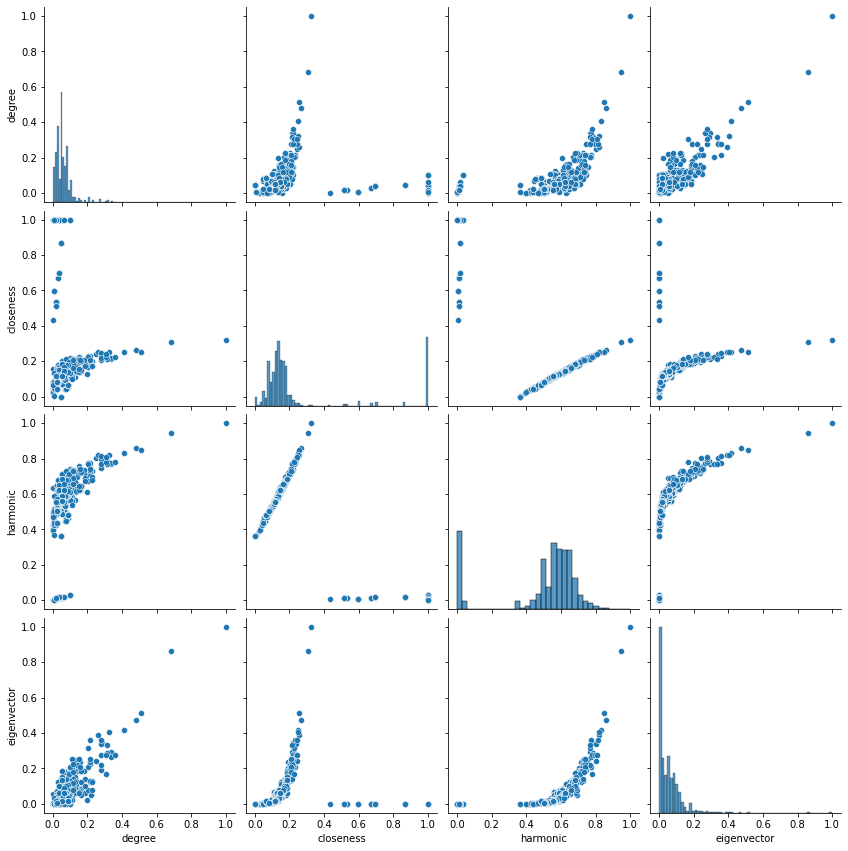

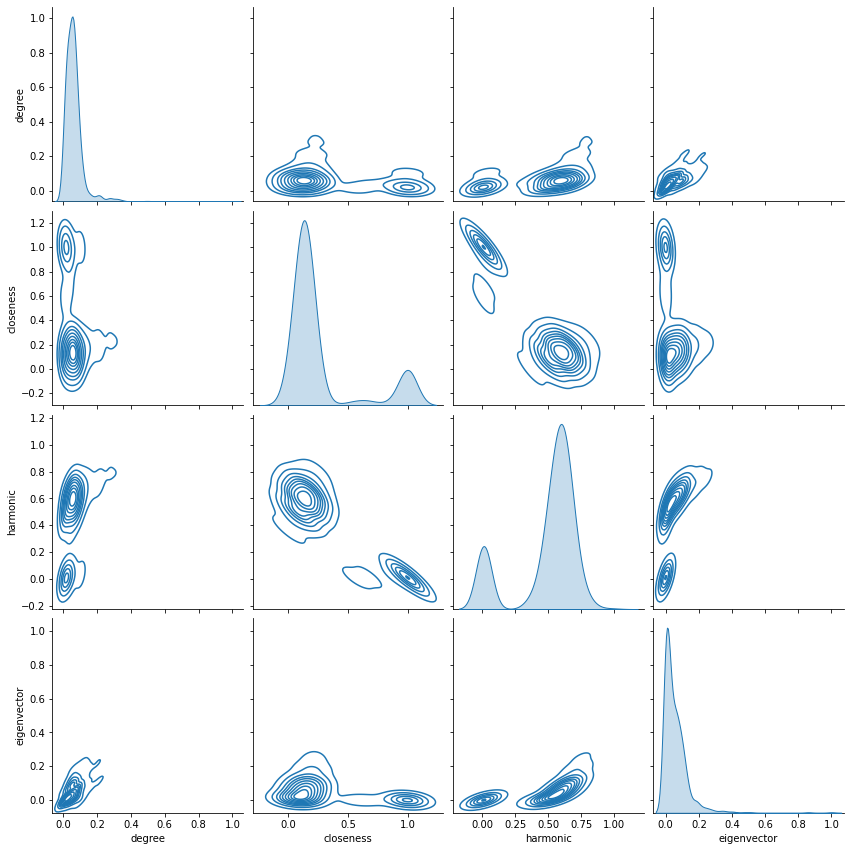

In [22]:
# scale the values before pairpolot
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0, 1))
# since output doesn't have col names we create a new df with col names
# used .round(n) to round the numbers to n decimal fractions
df_node_centrality_normal = pd.DataFrame(scaler.fit_transform(df_node_centrality).round(3) , columns=df_node_centrality.columns, index=df_node_centrality.index)

display(df_node_centrality_normal.sort_values('degree', ascending=False))

# plot correlation of nodes centralities
sns_plot = sns.pairplot(df_node_centrality_normal, height=3)
# sns_plot.savefig("graph_nodes_centrality_pairplot.pdf")

# KDE Plot is used for visualizing the Probability Density of a continuous variable.
sns_plot_kde = sns.pairplot(df_node_centrality_normal, kind="kde", height=3)
# sns_plot_kde.savefig("graph_nodes_centrality_pairplot_kde.pdf")

## visualize the Key-Word Graph

#### Plot General Settings

In [23]:
visual_style_general = {}

# Define color sets
color_set_grey = ['#A8A8A8', '#B1B1B1', '#B9B9B9', '#C2C2C2', '#CACACA', '#D3D3D3']
color_set_pink = ['#E0BBE4', '#957DAD', '#D291BC', '#FEC8D8', '#FFDFD3']
color_set_yellow = ['#FFD300', '#FFDC26', '#FFE54C', '#FFED73', '#FFF699', '#FFFFBF']
color_set_blue = ['#87CEFA', '#9BD7FB', '#B0E0FC', '#C1E9FC', '#D9F2FE', '#EDFBFF']
color_set_green = ['#ECFADC', '#DDF2D1', '#CDEBC5', '#BEE3BA', '#AEDCAE', '#9FD4A3']
color_set_blue_pastel = ['#91ABC9', '#9EB9D1', '#A5BFD3', '#ABC5D5', '#B2CBD7', '#B9D1D9']
color_set_yellow_red = ['#F87E39', '#FAB445', '#F9DB00', '#F0E990', '#EF4F31', '#CF0022']

# Set bbox and margin
visual_style_general["bbox"] = (0, 0, 1000, 1000)
visual_style_general["margin"] = 100

# Set vertex label Font
# visual_style_general["vertex_font"] = "Times New Roman"
visual_style_general["vertex_font"] = "Calibri"

# Set Vertex border color
visual_style_general["vertex_frame_color"] = '#555'

# Set Vertex border size
# visual_style_general["vertex_frame_size"] = [degree/5 for degree in g.vs['degree']]
visual_style_general["vertex_frame_size"] = "1px"

# Set Drawing order of the vertices
# Default: Vertices with a smaller order parameter will be drawn first
# visual_style_general["vertex_order"] = 

# Set label distance
visual_style_general["vertex_label_dist"] = None

# Set label color
visual_style_general["vertex_label_color"] = "#333"

# Set label angle
# visual_style_general["vertex_label_angle"] = math.radians(45)

# Set Edge Color
visual_style_general["edge_color"] = color_set_grey

### plot graph of keywords

In [37]:
visual_style = {}

# Set vertex label
# used farsify() to Show Farsi labels
visual_style["vertex_label"] = [farsify(label) for label in g.vs['label']]

# Set vertex colours
# visual_style["vertex_color"] = color_set_green
visual_style["vertex_color"] = g.vs['color']
# visual_style["vertex_color"] = igraph.drawing.colors.GradientPalette("#E0BBE4", "#FFDFD3", 40)

# Set vertex size
# scale the size of nodes (to have a better visualization)
visual_style["vertex_size"] = [degree/5 for degree in g.vs['degree']]
# visual_style["vertex_size"] = [closeness*20 for closeness in g.vs['closeness']]
# visual_style["vertex_size"] = [harmonic*40 for harmonic in g.vs['harmonic']]
# visual_style["vertex_size"] = [eigenvector*40 for eigenvector in g.vs['eigenvector']]

# Set vertex lable size
visual_style["vertex_label_size"] = [degree/10 for degree in g.vs['degree']]
# since it has NaN we have an extra if
# visual_style["vertex_label_size"] = [closeness*10 for closeness in g.vs['closeness'] if not np.isnan(closeness)]
# visual_style["vertex_label_size"] = [harmonic*20 for harmonic in g.vs['harmonic']]
# visual_style["vertex_label_size"] = [eigenvector*20 for eigenvector in g.vs['eigenvector']]

# Set Edge Width (BOn edges' betweenness)
from math import log
# visual_style['edge_width'] = [betweenness/2000 for betweenness in g.es['betweenness']]
# visual_style['edge_width'] = [log(betweenness)/10 for betweenness in g.es['betweenness']]
visual_style['edge_width'] = [weight/5 for weight in g.es['weight']]
# visual_style["edge_width"] = [1 + 2 * int(is_formal) for is_formal in g.es["is_formal"]]

# Whether curve the edges or not
visual_style["edge_curved"] = False
# visual_style["autocurve"] = True

# Set the layout (aka visualization algorithm)
my_layout = g.layout_fruchterman_reingold()
# my_layout = g.layout_graphopt(node_charge=0.005, node_mass=100, spring_length=0, spring_constant=1.5, max_sa_movement=100)
# my_layout = g.layout_graphopt(node_charge=0.005, node_mass=100, spring_length=30, spring_constant=1, max_sa_movement=100)
# my_layout = g.layout_grid()
# my_layout = g.layout_kamada_kawai()
# my_layout = g.layout_reingold_tilford_circular(mode='in')
# my_layout = g.layout_lgl()
# my_layout = g.layout_drl()
# my_layout = g.layout_mds()
# my_layout = g.layout_circle(order=sorted(g.vs['degree'], reverse=True))
# my_layout = g.layout_circle()
# my_layout = g.layout_random()
visual_style["layout"] = my_layout

# # Define Drawing order of the vertices. 
# # Vertices with a smaller order parameter will be drawn first.
# visual_style['vertex_order'] = g.vs['degree']

# # Define Export File
# visual_style["target"] = 'tag_network_igraph.pdf'

# # Plot the Graph visualization
# igraph.plot(g, **visual_style_general, **visual_style)

## Community Detection

In [25]:
# community detection BOn a graph --> results in an instance of "VertexClustering" class
# link: https://igraph.org/python/doc/api/igraph.clustering.VertexClustering.html#cluster_graph
# link: https://igraph.org/python/tutorial/latest/analysis.html#clustering

# using InfoMap method
community_infomap = g.community_infomap(edge_weights=g.es['weight'], vertex_weights=g.vs['degree'], trials=10)

# using EigenVector method (clusters BOn EigenVector value of nodes)
# result is very similar to layout of the original graph
community_eigenvector = g.community_leading_eigenvector(weights=g.es['weight'], clusters=2, arpack_options=None)

# usin Multi Level method (a version of Louvain)
# result is more distributed
# doesn't recognizes "resolution" parameters, as opposed to the documentation
community_multilevel = g.community_multilevel(weights=g.es['weight'], return_levels=False)
# community_multilevel = igraph.Graph.community_multilevel(g, weights=g.es['weight'], return_levels=False, resolution=1)

# using connected components method (aka Graph.clusters())
community_components = g.components(mode='strong')

# Using label_propagation
# good for when we have external info (e.g., ground truth)
community_label_propagation = g.community_label_propagation(weights=g.es['weight'], )

# using leiden method
# can (not necessarily) use external info (e.g., ground truth)
# doesn't work with "edge_weights" param which is in documentary !!!!
# But it supports "node_weights" param instead of "nodes" :) !!!!
# doesn't recognizes "normalize_resolution" parameters, as opposed to the documentation
# ** if find tune "resolution_parameter" does a pretty good job (like multilevel)
community_leiden = g.community_leiden(objective_function='CPM', weights=g.es['weight'], node_weights=g.vs['degree'], beta=0.01, resolution_parameter=.0001, n_iterations=20)

# print(help(g.community_leiden))

# # using Optimal Modularity method (exact solution, < 100 vertices)
# # very slow (in comparison with other)
# # restarts kernel in my case (cannot run it)
# community_optimalmodularity = g.community_optimal_modularity() 

### Compare community Detection methods (2 by 2)
#### By Rand Index

In [62]:
# documentation (in R but can be used for python)
# link: https://igraph.org/r/doc/compare.html

community_dict = {'infomap': community_infomap,
                  'eigenvector': community_eigenvector,
                  'multilevel': community_multilevel,
                  'components': community_components,
                  'label_propagation': community_label_propagation,
                  'leiden': community_leiden
                 }

df_community_by_rand = pd.DataFrame(columns=list(community_dict), index=list(community_dict))

# Compare all community detection methods with the Rand Index
for row in list(community_dict):
    for col in list(community_dict):
        df_community_by_rand.loc[row, col] = round(igraph.compare_communities(community_dict[row], community_dict[col], method="rand"), 3)
        
print("community detection comparison by Rand Index".center(65))
display(df_community_by_rand)

# table of community detection methods metrics
df_community_modularity = pd.DataFrame(columns=['modularity', '#communities'], index=list(community_dict))
df_community_modularity['modularity'] = [community_dict[row].modularity for row in list(community_dict)]
df_community_modularity['#communities'] = [community_dict[row].__len__() for row in list(community_dict)]

print("\ncommunity detection comparison by modularity & #clusters".center(65))
display(df_community_modularity)

           community detection comparison by Rand Index          


,infomap,eigenvector,multilevel,components,label_propagation,leiden
infomap,1.0,0.314,0.957,0.314,0.969,0.969
eigenvector,0.314,1.0,0.357,1.0,0.345,0.345
multilevel,0.957,0.357,1.0,0.357,0.954,0.975
components,0.314,1.0,0.357,1.0,0.345,0.345
label_propagation,0.969,0.345,0.954,0.345,1.0,0.961
leiden,0.969,0.345,0.975,0.345,0.961,1.0


    
community detection comparison by modularity & #clusters    


,modularity,#communities
infomap,0.125223,416
eigenvector,0.165528,34
multilevel,0.770097,53
components,0.168644,34
label_propagation,0.709064,100
leiden,0.770857,57


### Print/Plot Info about the result of our Community Detection Method

              community detection communities' stats             


C:\Users\hiruz\AppData\Local\Programs\Python\Python39\lib\site-packages\pandas\core\internals\blocks.py:938: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr_value = np.asarray(value)


,cluster_index,#nodes,percentile,community_name,community_members
0,6,83,0.09,NaN,"[مدیریت دانش, ارزش دانش مشتری, مدیریت دانش مشت..."
1,18,81,0.09,NaN,"[شبیه سازی, کلینیک دندانپزشکی, تفکر ناب, نقشه ..."
2,9,66,0.07,NaN,"[ارزیابی, اشتراکگذاری دانش, نوآوری باز, همکاری..."
3,42,60,0.07,NaN,"[بهینه سازی, نمودار کنترل, مدل آماری, تابع زیا..."
4,25,60,0.07,NaN,"[پیاده سازی, مدیریت کیفیت, تعمیم نام تجاری, نگ..."
...,...,...,...,...,...
48,52,3,0.00,NaN,"[مدیریت سیاست (خط مشی), شرکت رجا, حمل و نقل ریلی]"
49,39,2,0.00,NaN,"[زیست محیطی, منافع مالی]"
50,28,2,0.00,NaN,"[مدیریت دانش, چابکی]"
51,12,2,0.00,NaN,"[تأخیر سنوات تحصیلی, چالش های دانشگاهی]"


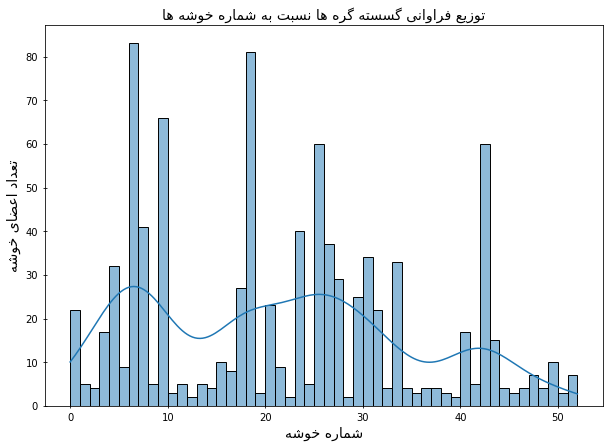

In [63]:
# set which community is going to be procesed
vertex_cluster = community_multilevel

# table of community detection methods metrics
print(f"community detection communities' stats".center(65))
df_communities_stat = pd.DataFrame(columns=['cluster_index', '#nodes', 'percentile', 'community_name', 'community_members'], index=range(vertex_cluster.__len__()))

# i: cluster_index, c: cluster (itself)
for i, c in enumerate(vertex_cluster):
    # # to have indecies of member nodes (a list)
    # members = vertex_cluster[i]
    # to have label of member nodes (a list)
    members = [vertex_cluster.graph.vs['label'][node] for node in vertex_cluster[i]]
    
    df_communities_stat.iloc[i].loc[['cluster_index', '#nodes', 'community_members']] = i, len(c), members

node_num = df_communities_stat['#nodes']
df_communities_stat['percentile'] = [round(node_num.iloc[row]/sum(node_num), 2)
                                     for row in range(len(df_communities_stat.index))]
                                   
display(df_communities_stat.sort_values('#nodes', ascending=False).reset_index(drop=True))

# Returns the histogram of cluster sizes.
# print(vertex_cluster.size_histogram())
fig, ax = plt.subplots(figsize=(10, 7))
label_font_size = 14
plt.ylabel(farsify("تعداد اعضای خوشه"), fontsize=label_font_size)
plt.xlabel(farsify("شماره خوشه"), fontsize=label_font_size)
plt.title(farsify("توزیع فراوانی گسسته گره ها نسبت به شماره خوشه ها"), fontsize=label_font_size)
# adjust the x axis params
ax.tick_params(axis='both', direction='inout', color='black', pad=5)
# plt.hist(vertex_cluster.membership)
ax = sns.histplot(data=sorted(vertex_cluster.membership), ax=ax, binwidth=1, bins=vertex_cluster.__len__(), kde=True)
plt.show()

### plot the dendrogram for communit detection

In [28]:
# # plot the dendrogram
# from scipy.cluster.hierarchy import dendrogram

# def plot_dendrogram(model, **kwargs):
#     # Create linkage matrix and then plot the dendrogram

#     # create the counts of samples under each node
#     counts = np.zeros(model.vscount().shape[0])
#     n_samples = len(model.labels_)
#     for i, merge in enumerate(model.children_):
#         current_count = 0
#         for child_idx in merge:
#             if child_idx < n_samples:
#                 current_count += 1  # leaf node
#             else:
#                 current_count += counts[child_idx - n_samples]
#         counts[i] = current_count

#     linkage_matrix = np.column_stack([model.children_, model.distances_,
#                                       counts]).astype(float)

#     # Plot the corresponding dendrogram
#     dendrogram(linkage_matrix, **kwargs)

# def full_dendrogram(model, **kwargs):
#     # set the plot size
#     fig, ax = plt.subplots(figsize=(20, 5))

#     plt.title('Hierarchical Clustering Dendrogram')
#     plot_dendrogram(model, **kwargs, ax=ax) 
#     plt.xlabel("Number of points in node (or index of point if no parenthesis).")
#     plt.show()

# # plot the top three/3 levels of the dendrogram
# full_dendrogram(vertex_cluster.graph, truncate_mode='lastp', p=26)

### Prepare the VertexClustering obj for Visualization
#### By converting it back to a graph (but this time with cluster_index & cluster_color for each Node)

In [29]:
# re-Create the original graph after clustering
clustered_graph = vertex_cluster.graph

# # Don't know why but Subgraphs Don't work
# # retrun the nth cluster subgraph
# clustered_graph = vertex_cluster.subgraph(3)  

# add the cluster_index for each node
clustered_graph.vs['cluster_index'] = vertex_cluster.membership
# print(clustered_graph.vs['cluster_index'])

# add color (Normalized RGBA) BOn cluster number and index
# used list() since iterator gets deleted in for loop
cluster_colors = list(igraph.drawing.colors.ClusterColoringPalette(n=vertex_cluster.__len__()))
clustered_graph.vs['cluster_color'] = [cluster_colors[index] for index in clustered_graph.vs['cluster_index']]

# # export the graph as a file (after community detection)
# clustered_graph.write_gml('community_multilevel_fullgraph.gml')

C:\Users\hiruz\AppData\Local\Temp/ipykernel_15060/93700347.py:18: RuntimeWarning: A non-numeric, non-string, non-boolean edge attribute was ignored at src/io/gml.c:717
  clustered_graph.write_gml('community_multilevel_fullgraph.gml')


### create a DataFrame of each cluster (with its nodes)
#### to name each cluster (community) BOn its members

In [30]:
# Create a DataFrame of nodes and their corresponding cluster index
df_cluster = pd.DataFrame({'label': clustered_graph.vs['label'], 'cluster_id': clustered_graph.vs['cluster_index']})
display(df_cluster)

# show all the nodes in cluster_index == i
display(df_cluster[df_cluster['cluster_id'] == 6].transpose())

,label,cluster_id
0,هماهنگی,0
1,مدیریت منابع,0
2,مدل سازی اطلاعات ساختمان,0
3,یکپارچه سازی اطلاعات,0
4,فرآیند کسب و کار,1
...,...,...
911,سیستم های تولیدی,25
912,شبیه سازی کامپیوتری,25
913,مدلسازی فرایند,3
914,فرایند خدمات ارتوپدی,3


,37,38,39,40,46,47,48,49,55,56,...,446,447,535,563,564,565,566,594,595,596
label,مدیریت دانش,ارزش دانش مشتری,مدیریت دانش مشتری,ارزش دوره عمر مشتری,فرایندکاوی,تحلیل عملکرد,فرایندتحصیلی,ارزیابی ناکارآمدی,سیستم های اطلاعاتی,پیش پردازش نگاره رویداد,...,اشتراک گذاری دانش,مشکلات اشتراک گذاری دانش,فرآیندهای دانش گرا,تجربه,یادگیری سازمانی,تجارب عملی مدیریت کیفیت,دانایی سازمانی,مهندسی پروژه,محیط پشتیبانی پروژه,دفتر مدیریت پروژه
cluster_id,6,6,6,6,6,6,6,6,6,6,...,6,6,6,6,6,6,6,6,6,6


### visualize the Clustered Community Graph

In [64]:
visual_style = {}

# Set vertex label
# used farsify() to Show Farsi labels
# visual_style["vertex_label"] = [farsify(label) for label in clustered_graph.vs['label']]
# visual_style["vertex_label"] = [farsify(label) for label in clustered_graph.vs['cluster_index']]
visual_style["vertex_label"] = [farsify(label) for label in clustered_graph.vs['label']]

# set palette color
# the result of each palette.get(#num) is a normalized ([0, 1]) RGBA color (as tuple) (R, G, B, Alpha)
# visual_style["palett"] = igraph.drawinclustered_graph.colors.GradientPalette("red", "blue", 40)
# visual_style["vertex_color"] = igraph.drawing.colors.ClusterColoringPalette(n=vertex_cluster.__len__())
visual_style["vertex_color"] = clustered_graph.vs['cluster_color']

# Set vertex size
# scale the size of nodes (to have a better visualization)
# visual_style["vertex_size"] = [degree for degree in clustered_graph.degree()]
visual_style["vertex_size"] = [degree/5 for degree in clustered_graph.vs['degree']]

# Set vertex lable size
visual_style["vertex_label_size"] = [degree/10 for degree in clustered_graph.vs['degree']]

# Set Edge Width (BOn edges' betweenness)
visual_style['edge_width'] = [weight/5 for weight in clustered_graph.es['weight']]

# Whether curve the edges or not
visual_style["edge_curved"] = False
# visual_style["autocurve"] = True

# Set the layout (aka visualization algorithm)
my_layout = clustered_graph.layout_fruchterman_reingold()
# my_layout = clustered_graph.layout_graphopt(node_charge=0.005, node_mass=100, spring_length=0, spring_constant=1.5, max_sa_movement=100)
# my_layout = clustered_graph.layout_graphopt(node_charge=0.005, node_mass=100, spring_length=30, spring_constant=1, max_sa_movement=100)
# my_layout = clustered_graph.layout_grid()
# my_layout = clustered_graph.layout_kamada_kawai()
# my_layout = clustered_graph.layout_reingold_tilford_circular(mode='in')
# my_layout = clustered_graph.layout_lgl()
# my_layout = clustered_graph.layout_drl()
# my_layout = clustered_graph.layout_mds()
# my_layout = clustered_graph.layout_circle(order=sorted(clustered_graph.vs['cluster_index'], reverse=True))
# my_layout = clustered_graph.layout_circle()
# my_layout = clustered_graph.layout_random()
visual_style["layout"] = my_layout

# # Define Export File
# visual_style["target"] = 'community_multilevel_fullgraph.pdf'

# Plot the Graph visualization
# can use inline=False to preview a file instead of in notebook
igraph.plot(clustered_graph, **visual_style_general, **visual_style)

### Create a Merged Graph (after Community detection)
#### This way all nodes in the same cluster get merged to create a single Super Node (representing that cluster)

In [32]:
# merge all nodes (in the same cluster) to a superNode
supernode_graph = vertex_cluster.cluster_graph(combine_vertices=None, combine_edges=None)

# add the Degree of each SuperNode
supernode_graph.vs['degree'] = supernode_graph.degree()

# add #sub-nodes in each SuperNode
supernode_graph.vs['#sub-nodes'] = [len(c) for c in vertex_cluster]

# add the cluster_index of each SuperNode as its Label
supernode_graph.vs['label'] = [i for i in range(supernode_graph.vcount())]

# # export the graph as a file (after community detection)
# supernode_graph.write_gml('community_multilevel_supernode_graph.gml')

### visualize the Merged Community Graph

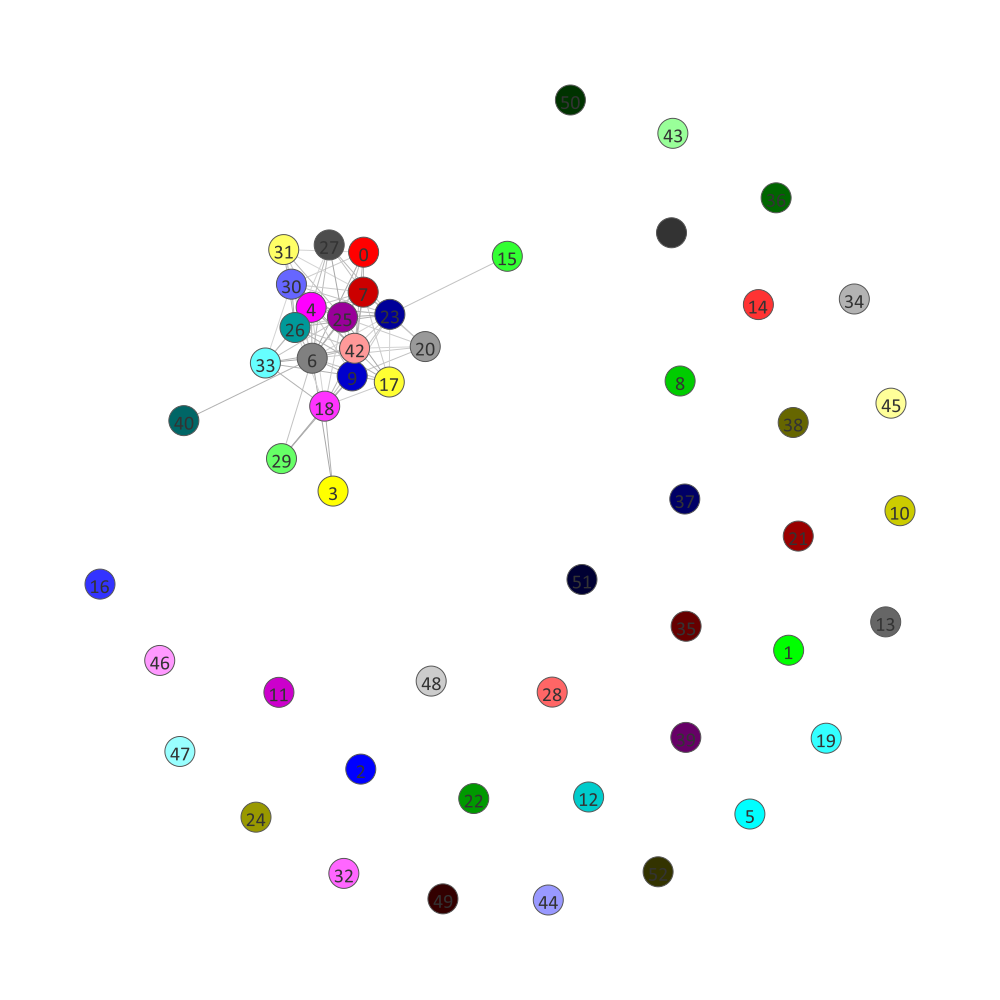

In [65]:
visual_style = {}

# Set vertex label
# used farsify() to Show Farsi labels
# visual_style["vertex_label"] = [farsify(label) for label in supernode_graph.vs]
visual_style["vertex_label"] = range(supernode_graph.vcount())

# set palette color
visual_style["vertex_color"] = igraph.drawing.colors.ClusterColoringPalette(n=vertex_cluster.__len__())
# visual_style["vertex_color"] = supernode_graph.vs['cluster_color']

# Set vertex size
# scale the size of nodes (to have a better visualization)
# visual_style["vertex_size"] = [degree*5 for degree in supernode_graph.vs['degree']]
visual_style["vertex_size"] = 30

# Set vertex lable size
# visual_style["vertex_label_size"] = [degree*2 for degree in supernode_graph.vs['degree']]
visual_style["vertex_label_size"] = 20

# Set Edge Width (BOn edges' betweenness)
# visual_style['edge_width'] = [weight/5 for weight in supernode_graph.es['weight']]

# Whether curve the edges or not
visual_style["edge_curved"] = False
# visual_style["autocurve"] = True

# Set the layout (aka visualization algorithm)
my_layout = supernode_graph.layout_fruchterman_reingold()
# my_layout = supernode_graph.layout_graphopt(node_charge=0.005, node_mass=100, spring_length=0, spring_constant=1.5, max_sa_movement=100)
# my_layout = supernode_graph.layout_graphopt(node_charge=0.005, node_mass=100, spring_length=30, spring_constant=1, max_sa_movement=100)
# my_layout = supernode_graph.layout_grid()
# my_layout = supernode_graph.layout_kamada_kawai()
# my_layout = supernode_graph.layout_reingold_tilford_circular(mode='in')
# my_layout = supernode_graph.layout_lgl()
# my_layout = supernode_graph.layout_drl()
# my_layout = supernode_graph.layout_mds()
# my_layout = supernode_graph.layout_circle(order=sorted(supernode_graph.vs['cluster_index'], reverse=True))
# my_layout = supernode_graph.layout_circle()
# my_layout = supernode_graph.layout_random()
visual_style["layout"] = my_layout

# # Define Export File
# visual_style["target"] = 'tag_network_igraph.pdf'

# Plot the Graph visualization
# can use inline=False to preview a file instead of in notebook
igraph.plot(supernode_graph, **visual_style_general, **visual_style, mark_groups = False)

#### These community detection Algo(s) return a vertexDendrogram

In [34]:
# calculate dendrogram
# takes a long time to calculate
community_edge_betweenness = g.community_edge_betweenness(directed=False, weights=g.es['weight'])

In [35]:
def fix_dendrogram(graph: igraph.Graph, cl):
    '''
    a Python function that takes a graph and an incomplete dendrogram 
    and completes the dendrogram by merging the remaining nodes in arbitrary order. 
    link: https://github.com/igraph/igraph/issues/675
    link: https://lists.nongnu.org/archive/html/igraph-help/2014-02/msg00067.html
    '''
    already_merged = set()
    for merge in cl.merges:
        already_merged.update(merge)

    num_dendrogram_nodes = graph.vcount() + len(cl.merges)
    not_merged_yet = sorted(set(range(num_dendrogram_nodes)) - already_merged)
    if len(not_merged_yet) < 2:
        return

    v1, v2 = not_merged_yet[:2]
    cl._merges.append((v1, v2))
    del not_merged_yet[:2]

    missing_nodes = range(num_dendrogram_nodes,
            num_dendrogram_nodes + len(not_merged_yet))
    cl._merges.extend(zip(not_merged_yet, missing_nodes))
    cl._nmerges = graph.vcount()-1

vertex_dendrogram = community_edge_betweenness

# Returns the optimal number of clusters for this dendrogram.
# it returns 1 since our graph is not connected
print("Optimal number of clusters: ", vertex_dendrogram.optimal_count)

# convert it into a flat clustering
# Doesn't work since our graph is not connected
# clusters = vertex_dendrogram.as_clustering()

Optimal number of clusters:  1


### Plot Communities with Dendrogram

In [40]:
visual_style_dendrogram = {}

# community = community_edge_betweenness
community = vertex_dendrogram

# Set bbox and margin
visual_style_dendrogram["bbox"] = (0, 0, 800, 800)
visual_style_dendrogram["margin"] = 50

# set palette color
visual_style_dendrogram["palette"] = igraph.drawing.colors.RainbowPalette(n=120, s=1, v=0.5, alpha=0.75)

visual_style_dendrogram["vertex_label"] = [farsify(label) for label in g.vs['label']]

# set the Dendrogram's orientation
# https://igraph.org/python/doc/api/igraph.clustering.Dendrogram.html#__plot__
visual_style_dendrogram['orientation'] = 'vertical'

# Define Export File
visual_style_dendrogram["target"] = 'plot.pdf'

igraph.plot(community, **visual_style_dendrogram)

cairo.MemoryError: out of memory

In [ ]:
#Add title and legend to igraph plots
# from igraph import Graph, Plot
from igraph.drawing.text import TextDrawer
import cairo



# graph_to_plot = community_eigenvector.cluster_graph()
graph_to_plot = community_edge_betweenness

# Make the plot draw itself on the Cairo surface
# plot.redraw()
                            
visual_style_dendrogram = {}

visual_style_dendrogram["vertex_size"] = 1000

# set palette color
visual_style_dendrogram["palette"] = 'red'

visual_style_dendrogram["vertex_label_size"] = 300

# set the Dendrogram's orientation
# https://igraph.org/python/doc/api/igraph.clustering.Dendrogram.html#__plot__
visual_style_dendrogram['orientation'] = 'vertical'

# Define Export File
visual_style_dendrogram["target"] = 'plot.pdf'

# Construct the plot
# plot = Plot("plot.png", bbox=(4*width, 4*height), background="white")
plot = igraph.plot(graph_to_plot, background="white", **visual_style_general, **visual_style_dendrogram)

# plot.add(g, bbox=(0, 0, 800, 800), margin=100)
# plot.show()